# GAN(Generative Adversarial Network)

Generator根据随机数生成有意义的数据，其中有好的也有不好的，然后Discriminator会判断哪些是真实数据，哪些是生成的数据，然后将学习到的经验传递给Generator

In [7]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

BATCH_SIZE = 64
LR_G = 0.0001
LR_D = 0.0001
N_IDEAS = 100 # generator的随机想法
ART_COMPONENTS = 15
PAINT_POINTS = np.vstack([np.linspace(-1, 1, ART_COMPONENTS) for _ in range(BATCH_SIZE)])

np.linspace(-1, 1, ART_COMPONENTS)在-1到1之间生成等差的15个点  
[np.linspace(-1, 1, ART_COMPONENTS) for _ in range(BATCH_SIZE)]重复生成 np.linspace(-1, 1, ART_COMPONENTS) 的结果 BATCH_SIZE 次  
np.vstack():纵向堆叠函数,将多个一维数组纵向堆叠为一个二维数组

In [8]:
def famous_artist_works():
    a = np.random.uniform(-1,1,size=BATCH_SIZE)[:,np.newaxis]
    paintings = a * np.power(PAINT_POINTS, 2) + (a-1)
    paintings = torch.from_numpy(paintings).float()
    return paintings

#因为PAINT_POINTS是等差的，所以这个图像大致是一个抛物线型的

np.random.uniform(-1,1,size=BATCH_SIZE)：返回值是一个长度为 BATCH_SIZE 的一维数组，所有元素都在 [-1, 1] 区间之间  
[:,np.newaxis]：将原本的一维数组转换为二维数组  
例如a = np.array([-0.5, 0.1, -0.8, 0.3])  
那么a[:, np.newaxis]=array([[-0.5],
       [ 0.1],
       [-0.8],
       [ 0.3]])

In [ ]:
G = nn.Sequential(
    nn.Linear(N_IDEAS, 128),
    nn.ReLU(),
    nn.Linear(128, ART_COMPONENTS)#输出画作
)

D = nn.Sequential(
    nn.Linear(ART_COMPONENTS, 128),#鉴赏家接受画作
    nn.ReLU(),
    nn.Linear(128, 1),#1代表鉴赏家判别接收到的画是不是著名画作
    nn.Sigmoid()#将输出压缩到0-1之间，百分比的形式，表示画作是名画的概率
)

opt_G = torch.optim.Adam(G.parameters(), lr=LR_G)
opt_D = torch.optim.Adam(D.parameters(), lr=LR_D)

#报错
# for step in range(10000):
#     artist_paintings = famous_artist_works()#找名画
#     G_ideas = torch.randn(BATCH_SIZE, N_IDEAS,requires_grad=True)#新手画家灵感 #生成的数据的shape是(BATCH_SIZE, N_IDEAS)
#     G_paintings = G(G_ideas) #新手画家画的画
#     G_loss = torch.mean(torch.log(1 - D_fake))#新手自认为是大师的G概率就是误差
#     opt_G.zero_grad()
#     G_loss.backward()
#     opt_G.step()
    
#     D_real = D(artist_paintings) #鉴赏家鉴别名画
#     D_fake = D(G_paintings) #鉴赏家鉴别新手画家的画
#     D_loss = -torch.mean(torch.log(D_real) + torch.log(1 - D_fake))#log完了是负数，所以在最前面加负号
#     opt_D.zero_grad()
#     D_loss.backward()
#     opt_D.step()

#正常
for step in range(10000):
    artist_paintings = famous_artist_works()  # 找名画
    G_ideas = torch.randn(BATCH_SIZE, N_IDEAS, requires_grad=True)  # 新手画家灵感
    G_paintings = G(G_ideas)  # 新手画家画的画

    # 生成器的损失
    D_fake_G = D(G_paintings)  # 不要 detach
    G_loss = torch.mean(torch.log(1 - D_fake_G))  # 生成器的损失
    opt_G.zero_grad()
    G_loss.backward()  # 计算生成器的梯度
    opt_G.step()

    # 判别器的损失
    D_real = D(artist_paintings)  # 鉴赏家鉴别名画
    D_fake = D(G_paintings.detach())  # 鉴赏家鉴别新手画家的画
    D_loss = -torch.mean(torch.log(D_real) + torch.log(1 - D_fake))
    opt_D.zero_grad()
    D_loss.backward()  # 不需要 retain_graph=True
    opt_D.step()
    
    if step % 500 == 0:
        print('Step:', step, 'D_loss:', D_loss.item(), 'G_loss:', G_loss.item())

Step: 0 D_loss: 1.541292667388916 G_loss: -0.6447630524635315
Step: 500 D_loss: 1.3347876071929932 G_loss: -0.6338992714881897
Step: 1000 D_loss: 1.2839473485946655 G_loss: -0.5780382752418518
Step: 1500 D_loss: 1.293858528137207 G_loss: -0.6986154317855835
Step: 2000 D_loss: 1.315170168876648 G_loss: -0.4967842698097229
Step: 2500 D_loss: 1.3514971733093262 G_loss: -0.6016949415206909
Step: 3000 D_loss: 1.3565031290054321 G_loss: -0.6775702238082886
Step: 3500 D_loss: 1.3628233671188354 G_loss: -0.6761142611503601
Step: 4000 D_loss: 1.3621952533721924 G_loss: -0.6645163297653198
Step: 4500 D_loss: 1.3534469604492188 G_loss: -0.6700960993766785
Step: 5000 D_loss: 1.3557735681533813 G_loss: -0.6724352836608887
Step: 5500 D_loss: 1.361006259918213 G_loss: -0.6772944927215576
Step: 6000 D_loss: 1.3637874126434326 G_loss: -0.6808281540870667
Step: 6500 D_loss: 1.371437430381775 G_loss: -0.6749714612960815
Step: 7000 D_loss: 1.3630867004394531 G_loss: -0.6899198293685913
Step: 7500 D_loss: 

D_loss:让D_real的成分增加，D_fake成分减少

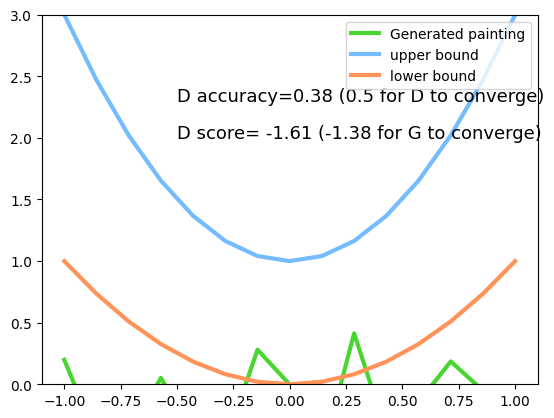

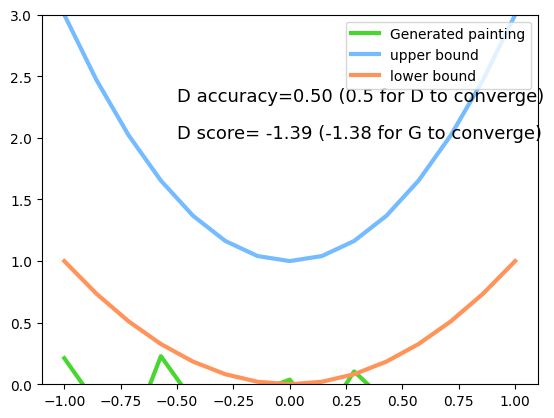

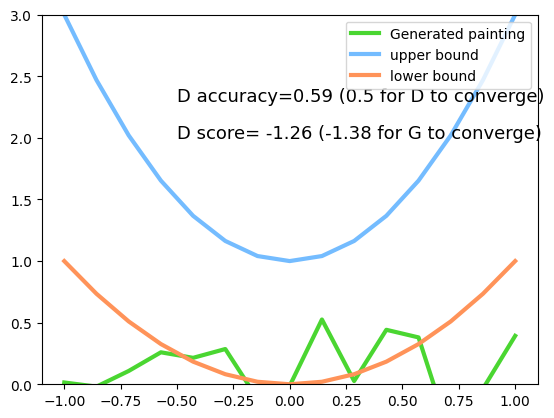

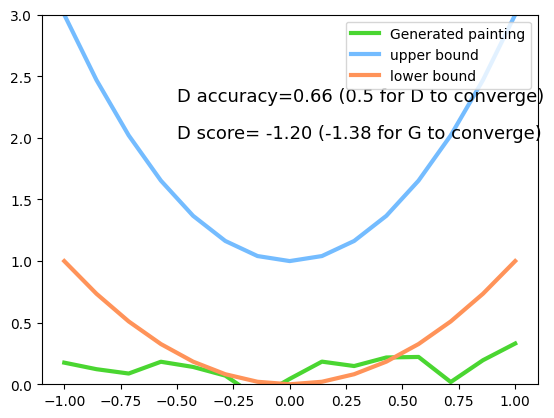

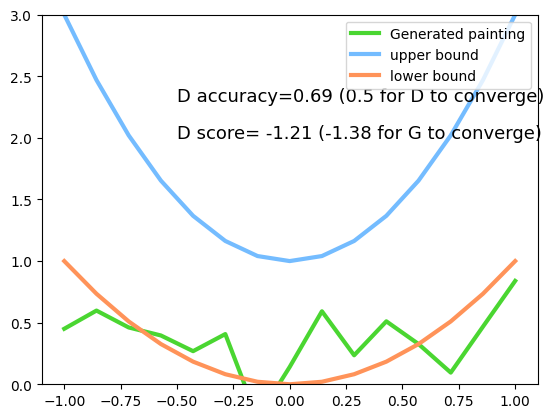

...

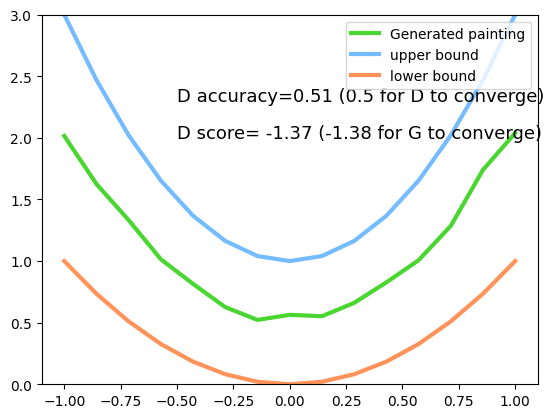

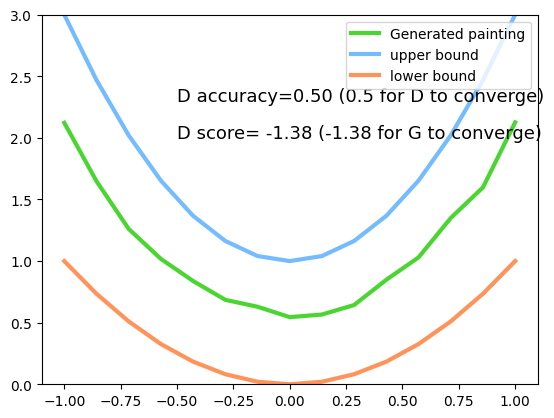

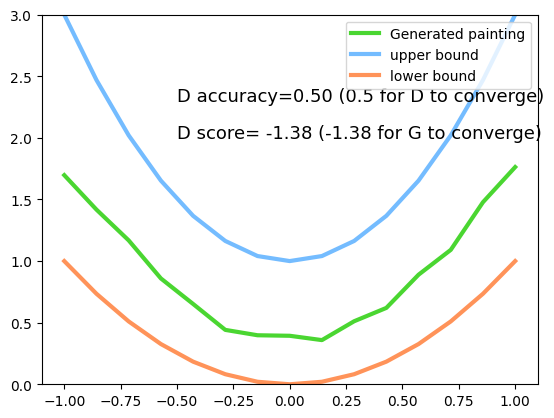

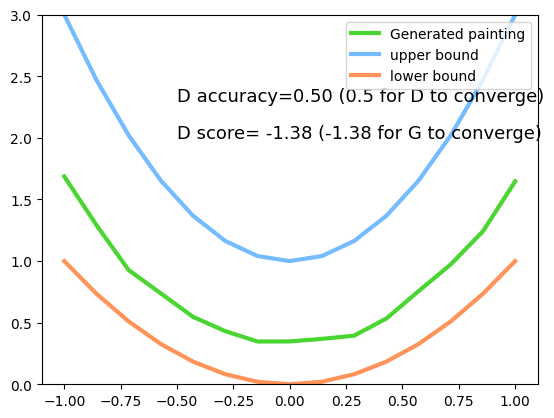

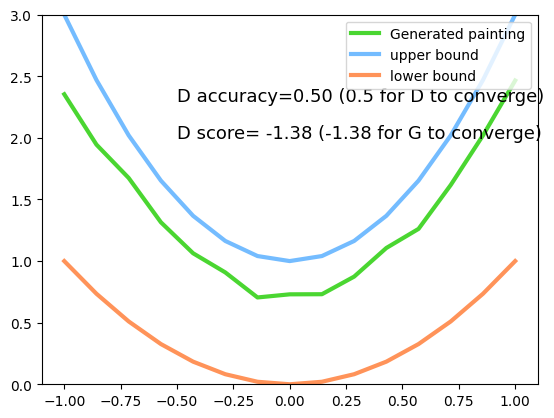

KeyboardInterrupt: 

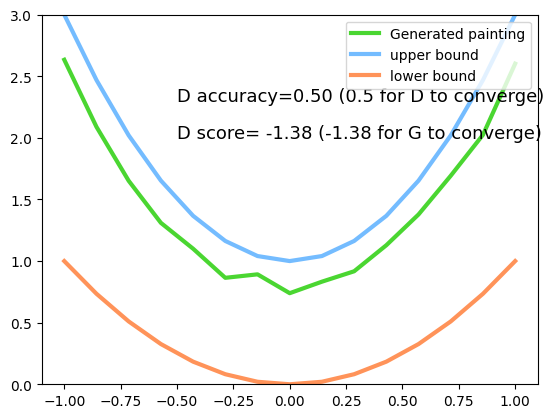

In [ ]:
#带图的
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

# torch.manual_seed(1)    # reproducible
# np.random.seed(1)

# Hyper Parameters
BATCH_SIZE = 64
LR_G = 0.0001           # learning rate for generator
LR_D = 0.0001           # learning rate for discriminator
N_IDEAS = 5             # think of this as number of ideas for generating an art work (Generator)
ART_COMPONENTS = 15     # it could be total point G can draw in the canvas
PAINT_POINTS = np.vstack([np.linspace(-1, 1, ART_COMPONENTS) for _ in range(BATCH_SIZE)])

# show our beautiful painting range
# plt.plot(PAINT_POINTS[0], 2 * np.power(PAINT_POINTS[0], 2) + 1, c='#74BCFF', lw=3, label='upper bound')
# plt.plot(PAINT_POINTS[0], 1 * np.power(PAINT_POINTS[0], 2) + 0, c='#FF9359', lw=3, label='lower bound')
# plt.legend(loc='upper right')
# plt.show()


def artist_works():     # painting from the famous artist (real target)
    a = np.random.uniform(1, 2, size=BATCH_SIZE)[:, np.newaxis]
    paintings = a * np.power(PAINT_POINTS, 2) + (a-1)
    paintings = torch.from_numpy(paintings).float()
    return paintings

G = nn.Sequential(                      # Generator
    nn.Linear(N_IDEAS, 128),            # random ideas (could from normal distribution)
    nn.ReLU(),
    nn.Linear(128, ART_COMPONENTS),     # making a painting from these random ideas
)

D = nn.Sequential(                      # Discriminator
    nn.Linear(ART_COMPONENTS, 128),     # receive art work either from the famous artist or a newbie like G
    nn.ReLU(),
    nn.Linear(128, 1),
    nn.Sigmoid(),                       # tell the probability that the art work is made by artist
)

opt_D = torch.optim.Adam(D.parameters(), lr=LR_D)
opt_G = torch.optim.Adam(G.parameters(), lr=LR_G)

plt.ion()   # something about continuous plotting

for step in range(10000):
    artist_paintings = artist_works()  # real painting from artist
    G_ideas = torch.randn(BATCH_SIZE, N_IDEAS, requires_grad=True)  # random ideas\n
    G_paintings = G(G_ideas)                    # fake painting from G (random ideas)
    prob_artist1 = D(G_paintings)               # D try to reduce this prob
    G_loss = torch.mean(torch.log(1. - prob_artist1))  
    opt_G.zero_grad()
    G_loss.backward()
    opt_G.step()
     
    prob_artist0 = D(artist_paintings)          # D try to increase this prob
    prob_artist1 = D(G_paintings.detach())  # D try to reduce this prob
    D_loss = - torch.mean(torch.log(prob_artist0) + torch.log(1. - prob_artist1))
    opt_D.zero_grad()
    D_loss.backward(retain_graph=True)      # reusing computational graph
    opt_D.step()

    if step % 50 == 0:  # plotting
        plt.cla()
        plt.plot(PAINT_POINTS[0], G_paintings.data.numpy()[0], c='#4AD631', lw=3, label='Generated painting',)
        plt.plot(PAINT_POINTS[0], 2 * np.power(PAINT_POINTS[0], 2) + 1, c='#74BCFF', lw=3, label='upper bound')
        plt.plot(PAINT_POINTS[0], 1 * np.power(PAINT_POINTS[0], 2) + 0, c='#FF9359', lw=3, label='lower bound')
        plt.text(-.5, 2.3, 'D accuracy=%.2f (0.5 for D to converge)' % prob_artist0.data.numpy().mean(), fontdict={'size': 13})
        plt.text(-.5, 2, 'D score= %.2f (-1.38 for G to converge)' % -D_loss.data.numpy(), fontdict={'size': 13})
        plt.ylim((0, 3));plt.legend(loc='upper right', fontsize=10);plt.draw();plt.pause(0.01)

plt.ioff()
plt.show()